In [2]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots
# Prompt used in ChatGPT: I have a csv file with column names Date,Port of Entry,Region,Mode,Sum of Volume. I would like to make an interactive line graph using plotly (programming language python). I would like to plot the sum of volume on the y axis and the year on the x axis. I would like to have data points with the sum of the sum of volume column for each month.  The data for each region would be a different colour on the line graph and I would also like there to be a row of buttons on the side so that the user can select which region they would like to see the data for, (all would also be a choice). Could you please generate some code to do this which I could run in vscode? 

# Load your CSV data
df = pd.read_csv('Data/traveller_report.csv')

# Extract year and month from the 'Date' column
df['Year'] = pd.to_datetime(df['Date']).dt.year
df['Month'] = pd.to_datetime(df['Date']).dt.month

# Create a list of unique regions for the dropdown
regions = ['Canada'] + df['Region'].unique().tolist()

# Define a list of unique colors for each region
colors = ['blue', 'red', 'green', 'orange', 'purple', 'pink', 'brown']

# Create an empty list to store the traces for each region
traces = []

# Create a subplot with buttons for region selection
fig = make_subplots(rows=1, cols=1, specs=[[{'type': 'scatter'}]])

# Initialize a list of visibility flags for the traces
visible_traces = [True] + [False] * (len(regions) - 1)

for i, region in enumerate(regions):
    if region == 'Canada':
        filtered_df = df
        name = 'Canada'
        color = 'black'  # Color for 'All' trace
    else:
        filtered_df = df[df['Region'] == region]
        name = region
        color = colors[i % len(colors)]  # Assign a unique color
    
    trace = go.Scatter(
        x=filtered_df.groupby(['Year', 'Month'])['Sum of Volume'].sum().reset_index()['Year'],
        y=filtered_df.groupby(['Year', 'Month'])['Sum of Volume'].sum().reset_index()['Sum of Volume'],
        mode='lines+markers',
        name=name,
        line=dict(color=color),  # Specify the line color
    )
    
    traces.append(trace)

# Add traces to the subplot
for trace in traces:
    fig.add_trace(trace)

# Define buttons for region selection
buttons = []
for i, region in enumerate(regions):
    buttons.append(
        dict(
            label=region,
            method='restyle',
            args=[
                {'y': [df[df['Region'] == region]['Sum of Volume'] if region != 'Canada' else df.groupby(['Year', 'Month'])['Sum of Volume'].sum().reset_index()['Sum of Volume']],
                 'visible': visible_traces,  # Update visibility based on the list
                 'name': region  # Specify the name (label) for the legend
                }
            ]
        )
    )

# Add a "Show All" button to display all regions
buttons.append(
    dict(
        label='Show All',
        method='restyle',
        args=[
            {'y': [df[df['Region'] == region]['Sum of Volume'] for region in regions],
             'visible': [True] * len(regions),  # Show all regions
             'name': regions  # Specify the name (label) for the legend
            }
        ]
    )
)

# Add buttons to the layout
fig.update_layout(
    updatemenus=[
        dict(
            buttons=buttons,
            direction="down",
            showactive=True,
            x=1.1,
            xanchor="left",
            y=1.2,
            yanchor="top",
        ),
    ]
)

# Update axis labels and title
fig.update_layout(
    xaxis_title="Year",
    yaxis_title="Sum of Volume",
    title="Annual Volume of Travellers by Year and Region in Canada",
)

# Show the interactive plot and save
fig.write_html("Images/travellers_line_graph.html")
fig.show()



In [71]:
import pandas as pd

df1 = pd.read_csv('Data/wages_filtered.csv')

# Define a mapping from job titles to job types (categories)
job_type_mapping = {
    'Cleaner': 'Cleaning',
    'Driver': 'Transport',
    'Waiter': 'Hospitality',
    'Cashier': 'Retail',
    'Tour Guide': 'Guides',
    # Add more mappings as needed
}

# Add a new column "Job_Type" based on the mapping
df1['Job_Type'] = df1['NOC_Title'].map(job_type_mapping)

# Check the result
print(df1.head())

   Unnamed: 0   NOC_CNP                            NOC_Title  \
0        2924  NOC_0621  retail and wholesale trade managers   
1        2925  NOC_0621  retail and wholesale trade managers   
2        2926  NOC_0621  retail and wholesale trade managers   
3        2927  NOC_0621  retail and wholesale trade managers   
4        2929  NOC_0621  retail and wholesale trade managers   

                                           Titre_CNP PROV ER_Code_Code_RE  \
0  Directeurs/directrices - commerce de dÃ©tail e...  NaN            ER00   
1  Directeurs/directrices - commerce de dÃ©tail e...   NL            ER10   
2  Directeurs/directrices - commerce de dÃ©tail e...   NL          ER1010   
3  Directeurs/directrices - commerce de dÃ©tail e...   NL          ER1020   
4  Directeurs/directrices - commerce de dÃ©tail e...   NL          ER1040   

                      ER_Name_Nom_RE  Low_Wage_Salaire_Minium  \
0                           National                    18.46   
1          Newfoundlan

In [72]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots
# Prompt used in ChatGPT: I have another csv file with the columns NOC_CNP,NOC_Title,Titre_CNP,PROV,ER_Code_Code_RE,ER_Name_Nom_RE,Low_Wage_Salaire_Minium,Median_Wage_Salaire_Median,High_Wage_Salaire_Maximal,Average_Wage_Salaire_Moyen,Data_Source_E,Data_Source_F,Reference_Period,Revision_Date_Date_revision,Annual_Wage_Flag_Salaire_annuel,Wage_Comment_E,Wage_Comment_F,Year,Wage_Comment_F1. I would like to make an interactive graph with this data. I would like the main graph to be a scatter plot with median_wage on the y axis and year on the x axis. I would like there to be different coloured points for each kind of job (cleaners, transport, hospitality, retail, guides). The jobs have not been sorted yet, or the average taken of the median wages for each category. I would also like the user to be able to use buttons to show a scatter plot for each of the different job types. Could you give me some code using plotly which would do this please?

# Load your CSV data
df = pd.read_csv('Data/wages_filtered.csv')

# Create a list of unique job types
job_types = df['NOC_Title'].unique().tolist()

# Define a list of unique colors for each job type
colors = ['blue', 'red', 'green', 'orange', 'purple']

# Create a subplot with buttons for job type selection
fig = make_subplots(rows=1, cols=1, specs=[[{'type': 'scatter'}]])

# Initialize a list of visibility flags for the traces
visible_traces = [True] + [False] * (len(job_types) - 1)

# Create a scatter plot for each job type
traces = []
for i, job_type in enumerate(job_types):
    filtered_df = df[df['NOC_Title'] == job_type]
    color = colors[i % len(colors)]  # Assign a unique color
    
    trace = go.Scatter(
        x=filtered_df['Year'],
        y=filtered_df['Median_Wage_Salaire_Median'],
        mode='markers',
        name=job_type,
        marker=dict(color=color),  # Specify the marker color
    )
    
    traces.append(trace)

# Add traces to the subplot
for trace in traces:
    fig.add_trace(trace)

# Define buttons for job type selection
buttons = []
for i, job_type in enumerate(job_types):
    buttons.append(
        dict(
            label=job_type,
            method='restyle',
            args=[
                {'x': [df[df['NOC_Title'] == job_type]['Year']],
                 'y': [df[df['NOC_Title'] == job_type]['Median_Wage_Salaire_Median']],
                 'visible': visible_traces,  # Update visibility based on the list
                 'mode': 'markers',
                 'name': job_type  # Specify the name (label) for the legend
                }
            ]
        )
    )

# Add a "Show All" button to display all job types together
buttons.append(
    dict(
        label='Show All',
        method='restyle',
        args=[
            {'x': [df[df['NOC_Title'] == job_type]['Year'] for job_type in job_types],
             'y': [df[df['NOC_Title'] == job_type]['Median_Wage_Salaire_Median'] for job_type in job_types],
             'visible': [True] * len(job_types),  # Show all job types
             'mode': 'markers',
             'name': job_types  # Specify the name (label) for the legend
            }
        ]
    )
)

# Add buttons to the layout
fig.update_layout(
    updatemenus=[
        dict(
            buttons=buttons,
            direction="down",
            showactive=True,
            x=1.1,
            xanchor="left",
            y=1.2,
            yanchor="top",
        ),
    ]
)

# Update axis labels and title
fig.update_layout(
    xaxis_title="Year",
    yaxis_title="Median Wage",
    title="Median Wage by Year and Job Type",
)

# Show the interactive plot and save
fig.write_html("Images/wages_scatter_plot.html")
fig.show()


In [73]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots
# Prompt used in ChatGPT: I would like to make another interactive graph using my first data set. I would like to make an interactive pie chart. Is it possible to do this using plotly?

# Load your CSV data
df = pd.read_csv('Data/traveller_report.csv')

# Extract season names from the 'Date' column
df['Date'] = pd.to_datetime(df['Date'])
df['Season'] = df['Date'].dt.strftime('%B')  # Convert month to season name

# Create a list of unique seasons
seasons = df['Season'].unique()

# Create a subplot for the pie chart
fig = make_subplots(rows=1, cols=1, specs=[[{'type': 'pie'}]])

# Initialize data for the initial pie chart (sum of volume for all seasons)
data = df.groupby(['Season'])['Sum of Volume'].sum()
labels = ['Spring', 'Summer', 'Fall', 'Winter']  # Season names

# Create the initial pie chart
pie_chart = go.Pie(
    labels=labels,
    values=data,
    name='All Seasons',
)

# Add the pie chart to the subplot
fig.add_trace(pie_chart)

# Define buttons for season selection
buttons = []

# Create a button for "All Seasons"
all_seasons_data = df.groupby(['Season'])['Sum of Volume'].sum()
all_seasons_pie = go.Pie(
    labels=labels,
    values=all_seasons_data,
    name='All Seasons',
)

# Update the layout for the pie chart
fig.update_layout(
    title="Volume of Travellers Entering Canada by Season",
)

# Show the interactive plot and save
fig.write_html("Images/seasons_pie_chart.html")
fig.show()



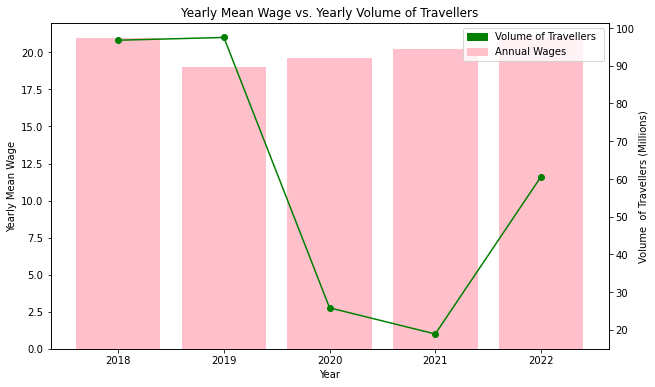

In [74]:
import pandas as pd
import matplotlib.pyplot as plt
# Prompt used in ChatGPT: I would like to make an interactive graph that uses both csv files. I would the wages data to be plotted as a bar graph with the years on the x axis and the yearly mean of the median_wage on the y axis. I would then like to plot the travellers data as a scatter plot with year on the x axis and sum of volume of all of the regions on the y axis. I would like to use plotly. Could you provide some code to do this please?

# Load your CSV data for wages
wages_df = pd.read_csv('Data/wages_filtered.csv')

# Load your CSV data for travelers
travelers_df = pd.read_csv('Data/traveller_report.csv')

# Calculate the yearly mean of the median_wage
wages_df['Year'] = pd.to_datetime(wages_df['Year'], format='%Y').dt.year
wages_mean_df = wages_df.groupby('Year')['Median_Wage_Salaire_Median'].mean().reset_index()

# Extract the year from the date column in travelers data
travelers_df['Year'] = pd.to_datetime(travelers_df['Date']).dt.year

# Filter travelers data for years 2018-2022
travelers_df = travelers_df[(travelers_df['Year'] >= 2018) & (travelers_df['Year'] <= 2022)]

# Aggregate the sum of volume for each year
sum_of_volume_df = travelers_df.groupby('Year')['Sum of Volume'].sum().reset_index()

# Pad wages' data with zeros for the additional year(s)
for year in sum_of_volume_df['Year'].unique():
    if year not in wages_mean_df['Year'].unique():
        wages_mean_df = wages_mean_df.append({'Year': year, 'Median_Wage_Salaire_Median': 0}, ignore_index=True)

# Sort the wages' data by year
wages_mean_df = wages_mean_df.sort_values(by='Year')

# Create a figure and axis with a larger figure size
fig, ax1 = plt.subplots(figsize=(10, 6))

# Create a bar graph for yearly wages on the left y-axis
ax1.bar(wages_mean_df['Year'], wages_mean_df['Median_Wage_Salaire_Median'], color='pink', label='Yearly Mean Wage')
ax1.set_xlabel('Year')
ax1.set_ylabel('Yearly Mean Wage', color='k')
ax1.tick_params(axis='y', labelcolor='k')

# Create a line plot for yearly sum of volume of all regions on the right y-axis
ax2 = ax1.twinx()

# Rescale sum of volume to millions
sum_of_volume_df['Sum of Volume'] = sum_of_volume_df['Sum of Volume'] / 1_000_000

ax2.plot(sum_of_volume_df['Year'], sum_of_volume_df['Sum of Volume'], color='green', label='Volume of Travellers', marker='o')
ax2.set_ylabel('Volume  of Travellers (Millions)', color='k')
ax2.tick_params(axis='y', labelcolor='k')

colors = {'Volume of Travellers ':'green', 'Annual Wages':'pink'}         
labels = list(colors.keys())
handles = [plt.Rectangle((0,0),1,1, color=colors[label]) for label in labels]

# Add a legend to the plot
plt.legend(handles, labels, loc='upper right')

# Set the title
plt.title('Yearly Mean Wage vs. Yearly Volume of Travellers')

# Save and show the plot
plt.savefig('Images/wages&travellers_graph.png')
plt.show()
